In [1]:
import numpy as np
import os
import shutil
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from sklearn import metrics
import pandas as pd

import ecoset
import categorization as cat

2024-05-27 21:31:25.664330: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-27 21:31:26.860267: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2024-05-27 21:31:26.860361: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2024-05-27 21:31:26.860368: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nv

In [2]:
dataDirs = {
    "animal": {
        "bird": "/data3/datasets/CUB200/",
        "dog": "/data3/datasets/stanfordDogs/",
    },
    "vehicle": {
        "car": "/data3/datasets/cars196/",
        "plane": "/data3/datasets/fgvcAircraft/",
    },
}

outDir = "./images/"

badCats = ["CUB_105.Whip_poor_Will"]

In [3]:
# Load one model
weightPath = f"./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_01/model.ckpt_epoch89"
model = ecoset.make_alex_net_v2(weights_path=weightPath)

# Remake model to ouptut at fc7
out = model.get_layer("fc7").output
out = tf.keras.layers.GlobalAveragePooling2D()(out)
model = tf.keras.Model(inputs=model.input, outputs=out)

model.summary()

2024-05-27 21:31:30.231491: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-27 21:31:30.243973: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-27 21:31:30.244643: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-27 21:31:30.245868: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_01/model.ckpt_epoch89 loaded successfully.
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 54, 54, 64)        23296     
                                                                 
 pool1 (MaxPooling2D)        (None, 26, 26, 64)        0         
                                                                 
 conv2 (Conv2D)              (None, 26, 26, 192)       307392    
                                                                 
 pool2 (MaxPooling2D)        (None, 12, 12, 192)       0         
                                                                 
 conv3 (Conv2D)              (None, 12, 12, 384)       663936    
       

In [4]:
# Create a similarity matrix for each category
simMats = {}
simCatMats = {}
catLabels = {}

for superCategory in dataDirs:
    simMats[superCategory] = {}
    simCatMats[superCategory] = {}
    catLabels[superCategory] = {}

    for category in dataDirs[superCategory]:
        dataDir = dataDirs[superCategory][category]
        print(f"Creating similarity matrix for {category} in {superCategory}...")

        # List subCategories
        subCats = os.listdir(os.path.join(dataDir, "train"))
        subCats.sort()

        # Loop through subCats
        reps = []
        averageReps = []
        labels = []
        for sub in subCats:
            print(f"  {sub}")
            # List files
            files = os.listdir(os.path.join(dataDir, "train", sub))

            # Load all images in the category
            images = []
            for file in files:
                imgPath = os.path.join(dataDir, "train", sub, file)
                img = Image.open(imgPath)
                img = ecoset.preprocess_alexnet(img)

                images.append(img)
            images = np.concatenate(images)

            # Get reps and labels
            catRep = model.predict(images, batch_size=64)
            reps += [catRep]
            averageReps += [np.mean(catRep, axis=0)]
            labels += [sub] * len(images)

        # Concatenate reps and labels
        reps = np.concatenate(reps, axis=0)
        averageReps = np.array(averageReps)
        labels = np.array(labels)

        # Calculate similarity matrix
        simMats[superCategory][category] = cat.default_gcm_sim_mat(reps)
        simCatMats[superCategory][category] = cat.default_gcm_sim_mat(averageReps)
        catLabels[superCategory][category] = labels

Creating similarity matrix for bird in animal...
  CUB_001.Black_footed_Albatross


2024-05-27 21:31:32.938369: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8202
2024-05-27 21:31:33.505618: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


1/1 [==============================] - 3s 3s/step
  CUB_002.Laysan_Albatross
1/1 [==============================] - 0s 31ms/step
  CUB_003.Sooty_Albatross
1/1 [==============================] - 0s 34ms/step
  CUB_004.Groove_billed_Ani
1/1 [==============================] - 0s 31ms/step
  CUB_005.Crested_Auklet
1/1 [==============================] - 0s 31ms/step
  CUB_006.Least_Auklet
1/1 [==============================] - 0s 26ms/step
  CUB_007.Parakeet_Auklet
1/1 [==============================] - 0s 31ms/step
  CUB_008.Rhinoceros_Auklet
1/1 [==============================] - 0s 31ms/step
  CUB_009.Brewer_Blackbird
1/1 [==============================] - 0s 29ms/step
  CUB_010.Red_winged_Blackbird
1/1 [==============================] - 0s 31ms/step
  CUB_011.Rusty_Blackbird
1/1 [==============================] - 0s 23ms/step
  CUB_012.Yellow_headed_Blackbird
1/1 [==============================] - 0s 23ms/step
  CUB_013.Bobolink
1/1 [==============================] - 0s 24ms/step
  CUB_

2024-05-27 21:33:38.846876: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.40GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-27 21:33:38.979199: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.47GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


2/2 [==============================] - 3s 1s/step


2024-05-27 21:33:40.077325: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.38GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-27 21:33:40.164843: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.33GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


  n02085782-Japanese_spaniel
2/2 [==============================] - 0s 80ms/step
  n02085936-Maltese_dog
2/2 [==============================] - 0s 80ms/step
  n02086079-Pekinese
2/2 [==============================] - 0s 81ms/step
  n02086240-Shih-Tzu
2/2 [==============================] - 0s 81ms/step
  n02086646-Blenheim_spaniel
2/2 [==============================] - 0s 80ms/step
  n02086910-papillon
2/2 [==============================] - 0s 82ms/step
  n02087046-toy_terrier
2/2 [==============================] - 0s 81ms/step
  n02087394-Rhodesian_ridgeback
2/2 [==============================] - 0s 80ms/step
  n02088094-Afghan_hound
2/2 [==============================] - 0s 80ms/step
  n02088238-basset
2/2 [==============================] - 0s 79ms/step
  n02088364-beagle
2/2 [==============================] - 0s 82ms/step
  n02088466-bloodhound
2/2 [==============================] - 0s 81ms/step
  n02088632-bluetick
2/2 [==============================] - 0s 83ms/step
  n02089078-blac

2024-05-27 21:39:07.286960: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.39GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-27 21:39:07.382357: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.37GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


  001.Acura_Integra_Type_R_2001
1/1 [==============================] - 0s 27ms/step
  002.Acura_RL_Sedan_2012
1/1 [==============================] - 1s 1s/step


2024-05-27 21:39:10.305880: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.38GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-27 21:39:10.382882: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.31GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


  003.Acura_TL_Sedan_2012
1/1 [==============================] - 1s 1s/step


2024-05-27 21:39:12.144314: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.39GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-27 21:39:12.240165: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.36GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


  004.Acura_TL_Type-S_2008
1/1 [==============================] - 1s 1s/step
  005.Acura_TSX_Sedan_2012
1/1 [==============================] - 1s 1s/step
  006.Acura_ZDX_Hatchback_2012
1/1 [==============================] - 1s 1s/step
  007.Aston_Martin_V8_Vantage_Convertible_2012
1/1 [==============================] - 0s 28ms/step
  008.Aston_Martin_V8_Vantage_Coupe_2012
1/1 [==============================] - 0s 25ms/step
  009.Aston_Martin_Virage_Convertible_2012
1/1 [==============================] - 1s 1s/step
  010.Aston_Martin_Virage_Coupe_2012
1/1 [==============================] - 1s 1s/step
  011.Audi_100_Sedan_1994
1/1 [==============================] - 0s 26ms/step
  012.Audi_100_Wagon_1994
1/1 [==============================] - 0s 27ms/step
  013.Audi_A5_Coupe_2012
1/1 [==============================] - 0s 27ms/step
  014.Audi_R8_Coupe_2012
1/1 [==============================] - 0s 27ms/step
  015.Audi_RS_4_Convertible_2008
1/1 [==============================] - 1s 1s/step


In [5]:
# Loop through categories to find calculate sil scores
silScores = {}
for superCategory in simMats:
    silScores[superCategory] = {}
    for category in simMats[superCategory]:
        print(f"Calculating silhouette score for {category} in {superCategory}...")

        # Calculate silhouette score
        scores = metrics.silhouette_samples(
            simMats[superCategory][category], catLabels[superCategory][category]
        )

        # Get mean silhouette score for each subCategory
        meanScores = []
        for sub in np.unique(catLabels[superCategory][category]):
            meanScores.append(
                np.mean(scores[catLabels[superCategory][category] == sub])
            )

        silScores[superCategory][category] = np.array(meanScores)

Calculating silhouette score for bird in animal...
Calculating silhouette score for dog in animal...
Calculating silhouette score for car in vehicle...
Calculating silhouette score for plane in vehicle...


In [6]:
# Pick the top k categories based on silhouette scores
k = 5

highCats = {}
lowCats = {}
midCats = {}
for superCategory in silScores:
    highCats[superCategory] = {}
    lowCats[superCategory] = {}
    midCats[superCategory] = {}
    for category in silScores[superCategory]:
        print(f"Finding categories for {category} in {superCategory}...")
        labels = np.unique(catLabels[superCategory][category])

        # Get top k categories
        sortIdx = np.argsort(silScores[superCategory][category])

        highCats[superCategory][category] = labels[sortIdx[-k:]]
        lowCats[superCategory][category] = labels[sortIdx[:k]]

        # Find the middle index
        midIdx = len(sortIdx) // 2
        midCats[superCategory][category] = labels[
            sortIdx[int(midIdx - np.floor(k / 2)) : int(midIdx + np.ceil(k / 2))]
        ]

Finding categories for bird in animal...
Finding categories for dog in animal...
Finding categories for car in vehicle...
Finding categories for plane in vehicle...


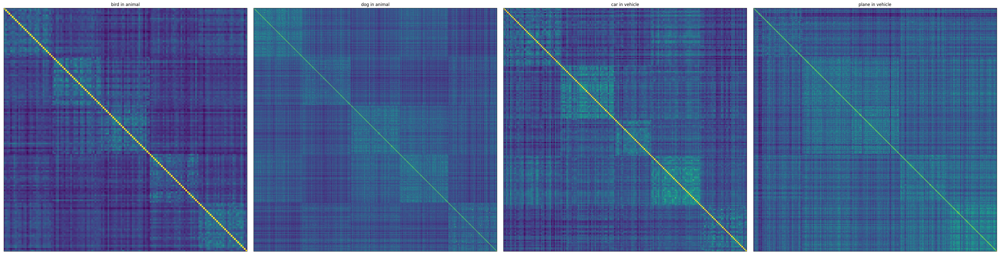

In [7]:
# Plot similarity matrices for high sillhouette score categories
fig, axs = plt.subplots(1, 4, figsize=(40, 10))

plotIdx = 0
for superCategory in highCats.keys():
    for category in highCats[superCategory].keys():
        chosenCats = highCats[superCategory][category]

        # Get the similarity matrix for this category
        simMat = simMats[superCategory][category]

        # Filter similarity matrix by the chosen categories
        idxs = np.isin(catLabels[superCategory][category], chosenCats)
        simMat = simMat[idxs, :][:, idxs]

        # Plot similarity matrix
        axs[plotIdx].imshow(simMat, cmap="viridis")
        axs[plotIdx].set_title(f"{category} in {superCategory}")
        axs[plotIdx].set_xticks([])
        axs[plotIdx].set_yticks([])

        plotIdx += 1

# Tight layout
plt.tight_layout()

fig.show()

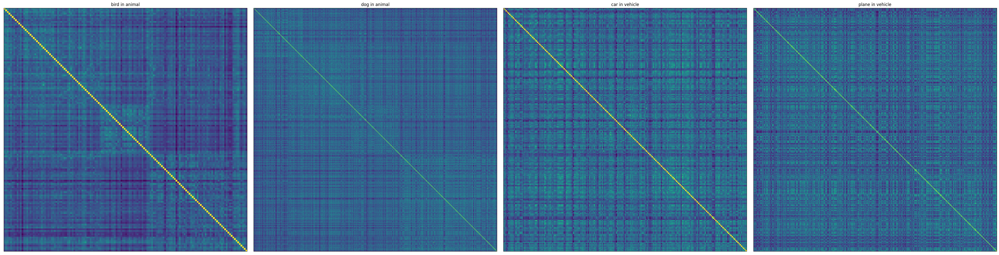

In [8]:
# Plot similarity matrices for low sillhouette score categories
fig, axs = plt.subplots(1, 4, figsize=(40, 10))

plotIdx = 0
for superCategory in lowCats.keys():
    for category in lowCats[superCategory].keys():
        chosenCats = lowCats[superCategory][category]

        # Get the similarity matrix for this category
        simMat = simMats[superCategory][category]

        # Filter similarity matrix by the chosen categories
        idxs = np.isin(catLabels[superCategory][category], chosenCats)
        simMat = simMat[idxs, :][:, idxs]

        # Plot similarity matrix
        axs[plotIdx].imshow(simMat, cmap="viridis")
        axs[plotIdx].set_title(f"{category} in {superCategory}")
        axs[plotIdx].set_xticks([])
        axs[plotIdx].set_yticks([])

        plotIdx += 1

# Tight layout
plt.tight_layout()

fig.show()

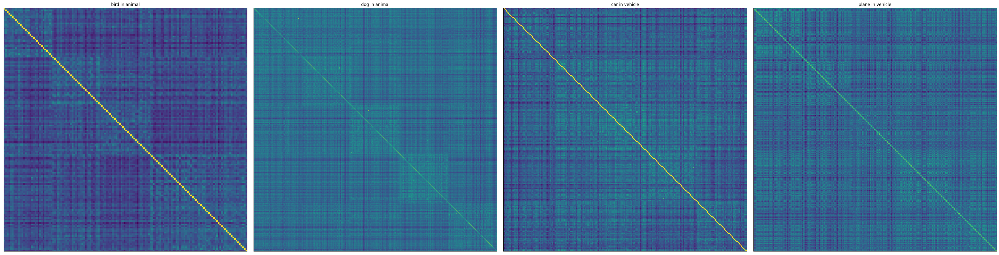

In [9]:
# Plot similarity matrices for mid sillhouette score categories
fig, axs = plt.subplots(1, 4, figsize=(40, 10))

plotIdx = 0
for superCategory in midCats.keys():
    for category in midCats[superCategory].keys():
        chosenCats = midCats[superCategory][category]

        # Get the similarity matrix for this category
        simMat = simMats[superCategory][category]

        # Filter similarity matrix by the chosen categories
        idxs = np.isin(catLabels[superCategory][category], chosenCats)
        simMat = simMat[idxs, :][:, idxs]

        # Plot similarity matrix
        axs[plotIdx].imshow(simMat, cmap="viridis")
        axs[plotIdx].set_title(f"{category} in {superCategory}")
        axs[plotIdx].set_xticks([])
        axs[plotIdx].set_yticks([])

        plotIdx += 1

# Tight layout
plt.tight_layout()

fig.show()

In [10]:
# Copy datasets to new directories
highDir = os.path.join(outDir, "highCats")
lowDir = os.path.join(outDir, "lowCats")
midDir = os.path.join(outDir, "midCats")

os.makedirs(highDir, exist_ok=True)
os.makedirs(lowDir, exist_ok=True)
os.makedirs(midDir, exist_ok=True)

for superCategory in highCats.keys():
    for category in highCats[superCategory].keys():
        chosenCats = highCats[superCategory][category]

        # Copy images to new directory
        for chosenCat in chosenCats:
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "train", chosenCat),
                os.path.join(highDir, "train", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "test", chosenCat),
                os.path.join(highDir, "test", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )

for superCategory in lowCats.keys():
    for category in lowCats[superCategory].keys():
        chosenCats = lowCats[superCategory][category]

        # Copy images to new directory
        for chosenCat in chosenCats:
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "train", chosenCat),
                os.path.join(lowDir, "train", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "test", chosenCat),
                os.path.join(lowDir, "test", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )

for superCategory in midCats.keys():
    for category in midCats[superCategory].keys():
        chosenCats = midCats[superCategory][category]

        # Copy images to new directory
        for chosenCat in chosenCats:
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "train", chosenCat),
                os.path.join(midDir, "train", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "test", chosenCat),
                os.path.join(midDir, "test", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )

In [11]:
# Build imgInfo
highInfo = []

for set in ["train", "test"]:
    for superCategory in highCats.keys():
        for category in highCats[superCategory].keys():
            for subCat in highCats[superCategory][category]:
                imgDir = os.path.join(highDir, set, superCategory, category, subCat)
                imgs = os.listdir(imgDir)
                imgs.sort()
                imgs = imgs[:20]

                highInfo += [
                    pd.DataFrame(
                        {
                            "path": [os.path.join(imgDir, img) for img in imgs],
                            "name": imgs,
                            "super": [superCategory] * len(imgs),
                            "basic": [category] * len(imgs),
                            "sub": [subCat] * len(imgs),
                            "set": [set] * len(imgs),
                        }
                    )
                ]

highInfo = pd.concat(highInfo)

lowInfo = []
for set in ["train", "test"]:
    for superCategory in lowCats.keys():
        for category in lowCats[superCategory].keys():
            for subCat in lowCats[superCategory][category]:
                imgDir = os.path.join(lowDir, set, superCategory, category, subCat)
                imgs = os.listdir(imgDir)
                imgs.sort()
                imgs = imgs[:20]

                lowInfo += [
                    pd.DataFrame(
                        {
                            "path": [os.path.join(imgDir, img) for img in imgs],
                            "name": imgs,
                            "super": [superCategory] * len(imgs),
                            "basic": [category] * len(imgs),
                            "sub": [subCat] * len(imgs),
                            "set": [set] * len(imgs),
                        }
                    )
                ]

lowInfo = pd.concat(lowInfo)

midInfo = []
for set in ["train", "test"]:
    for superCategory in midCats.keys():
        for category in midCats[superCategory].keys():
            for subCat in midCats[superCategory][category]:
                imgDir = os.path.join(midDir, set, superCategory, category, subCat)
                imgs = os.listdir(imgDir)
                imgs.sort()
                imgs = imgs[:20]

                midInfo += [
                    pd.DataFrame(
                        {
                            "path": [os.path.join(imgDir, img) for img in imgs],
                            "name": imgs,
                            "super": [superCategory] * len(imgs),
                            "basic": [category] * len(imgs),
                            "sub": [subCat] * len(imgs),
                            "set": [set] * len(imgs),
                        }
                    )
                ]

midInfo = pd.concat(midInfo)

# Save infos
highInfo.to_csv("highImgInfo.csv", index=False)
lowInfo.to_csv("lowImgInfo.csv", index=False)
midInfo.to_csv("midImgInfo.csv", index=False)

In [16]:
# Find categories with the most category separation
k = 5

highSepCats = {}
midSepCats = {}
lowSepCats = {}
for superCategory in simMats:
    highSepCats[superCategory] = {}
    midSepCats[superCategory] = {}
    lowSepCats[superCategory] = {}

    for category in simMats[superCategory]:
        print(f"Analyzing {category} in {superCategory}...")

        # Only work on upper triangle
        catMat = simCatMats[superCategory][category]
        triSims = catMat[np.triu_indices(catMat.shape[0], k=1)]
        triIdxs = np.argsort(triSims)

        subLabels = np.unique(catLabels[superCategory][category])

        # Get the pair of categories that are the most similar
        choices = list(np.unravel_index(triIdxs[0], catMat.shape))

        # Check if the choice is a badCat
        while subLabels[choices[0]] in badCats or subLabels[choices[1]] in badCats:
            idx = 1
            choices = list(np.unravel_index(triIdxs[idx], catMat.shape))
            idx += 1

        # Loop until we get enough
        while len(choices) < k:
            # Subset and get sorted indices
            subIdxs = np.argsort(np.mean(catMat[choices, :], axis=0))

            # Pick the first index that isn't in choices already for high sep
            for idx in subIdxs:
                if idx not in choices and subLabels[idx] not in badCats:
                    choices.append(idx)
                    break

        # Get the labels
        highSepCats[superCategory][category] = subLabels[choices]

        # Get the pair of categories that are the most dissimilar
        choices = list(np.unravel_index(triIdxs[-1], catMat.shape))

        # Check if the choice is a badCat
        while subLabels[choices[0]] in badCats or subLabels[choices[1]] in badCats:
            idx = 2
            choices = list(np.unravel_index(triIdxs[-idx], catMat.shape))
            idx += 1

        # Loop until we get enough
        while len(choices) < k:
            # Subset and get sorted indices
            subIdxs = np.argsort(np.mean(catMat[choices, :], axis=0))

            # Pick the first index that isn't in choices already for low sep
            for idx in subIdxs[::-1]:
                if idx not in choices and subLabels[idx] not in badCats:
                    choices.append(idx)
                    break

        # Get the labels
        lowSepCats[superCategory][category] = subLabels[choices]

        # Get the pair of categories that the medium separation
        choices = list(np.unravel_index(triIdxs[len(triIdxs) // 2], catMat.shape))

        # Check if the choice is a badCat
        while subLabels[choices[0]] in badCats or subLabels[choices[1]] in badCats:
            idx = 2
            choices = list(
                np.unravel_index(triIdxs[len(triIdxs) // 2 - idx], catMat.shape)
            )
            idx += 1

        # Loop until we get enough
        while len(choices) < k:
            # Subset and get sorted indices
            subIdxs = np.argsort(np.mean(catMat[choices, :], axis=0))

            # Find the median index
            midIdx = len(subIdxs) // 2

            # Pick the first index from mid
            for idx in subIdxs[midIdx:]:
                if idx not in choices and subLabels[idx] not in badCats:
                    choices.append(idx)
                    break

            # Double check whether or not we have too many choices
            if len(choices) == k:
                break

            # Pick the first index before mid
            for idx in subIdxs[:midIdx][::-1]:
                if idx not in choices:
                    choices.append(idx)
                    break

        # Get the labels
        midSepCats[superCategory][category] = subLabels[choices]

Analyzing bird in animal...
Analyzing dog in animal...
Analyzing car in vehicle...
Analyzing plane in vehicle...


In [18]:
# Copy datasets to new directories
highDir = os.path.join(outDir, "highSepCats")
lowDir = os.path.join(outDir, "lowSepCats")
midDir = os.path.join(outDir, "midSepCats")

os.makedirs(highDir, exist_ok=True)
os.makedirs(lowDir, exist_ok=True)
os.makedirs(midDir, exist_ok=True)

for superCategory in highSepCats.keys():
    for category in highSepCats[superCategory].keys():
        chosenCats = highSepCats[superCategory][category]

        # Copy images to new directory
        for chosenCat in chosenCats:
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "train", chosenCat),
                os.path.join(highDir, "train", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "test", chosenCat),
                os.path.join(highDir, "test", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )

for superCategory in lowSepCats.keys():
    for category in lowSepCats[superCategory].keys():
        chosenCats = lowSepCats[superCategory][category]

        # Copy images to new directory
        for chosenCat in chosenCats:
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "train", chosenCat),
                os.path.join(lowDir, "train", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "test", chosenCat),
                os.path.join(lowDir, "test", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )

for superCategory in midSepCats.keys():
    for category in midSepCats[superCategory].keys():
        chosenCats = midSepCats[superCategory][category]

        # Copy images to new directory
        for chosenCat in chosenCats:
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "train", chosenCat),
                os.path.join(midDir, "train", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )
            shutil.copytree(
                os.path.join(dataDirs[superCategory][category], "test", chosenCat),
                os.path.join(midDir, "test", superCategory, category, chosenCat),
                dirs_exist_ok=True,
            )

In [19]:
# Build imgInfo
highInfo = []

for set in ["train", "test"]:
    for superCategory in highSepCats.keys():
        for category in highSepCats[superCategory].keys():
            for subCat in highSepCats[superCategory][category]:
                imgDir = os.path.join(highDir, set, superCategory, category, subCat)
                imgs = os.listdir(imgDir)
                imgs.sort()
                imgs = imgs[:20]

                # Check if there are 20 images
                if len(imgs) < 20:
                    raise ValueError(f"Only {len(imgs)} images found in {imgDir}")

                highInfo += [
                    pd.DataFrame(
                        {
                            "path": [os.path.join(imgDir, img) for img in imgs],
                            "name": imgs,
                            "super": [superCategory] * len(imgs),
                            "basic": [category] * len(imgs),
                            "sub": [subCat] * len(imgs),
                            "set": [set] * len(imgs),
                        }
                    )
                ]

highInfo = pd.concat(highInfo)

lowInfo = []
for set in ["train", "test"]:
    for superCategory in lowSepCats.keys():
        for category in lowSepCats[superCategory].keys():
            for subCat in lowSepCats[superCategory][category]:
                imgDir = os.path.join(lowDir, set, superCategory, category, subCat)
                imgs = os.listdir(imgDir)
                imgs.sort()
                imgs = imgs[:20]

                # Check if there are 20 images
                if len(imgs) < 20:
                    raise ValueError(f"Only {len(imgs)} images found in {imgDir}")

                lowInfo += [
                    pd.DataFrame(
                        {
                            "path": [os.path.join(imgDir, img) for img in imgs],
                            "name": imgs,
                            "super": [superCategory] * len(imgs),
                            "basic": [category] * len(imgs),
                            "sub": [subCat] * len(imgs),
                            "set": [set] * len(imgs),
                        }
                    )
                ]

lowInfo = pd.concat(lowInfo)

midInfo = []
for set in ["train", "test"]:
    for superCategory in midSepCats.keys():
        for category in midSepCats[superCategory].keys():
            for subCat in midSepCats[superCategory][category]:
                imgDir = os.path.join(midDir, set, superCategory, category, subCat)
                imgs = os.listdir(imgDir)
                imgs.sort()
                imgs = imgs[:20]

                # Check if there are 20 images
                if len(imgs) < 20:
                    raise ValueError(f"Only {len(imgs)} images found in {imgDir}")

                midInfo += [
                    pd.DataFrame(
                        {
                            "path": [os.path.join(imgDir, img) for img in imgs],
                            "name": imgs,
                            "super": [superCategory] * len(imgs),
                            "basic": [category] * len(imgs),
                            "sub": [subCat] * len(imgs),
                            "set": [set] * len(imgs),
                        }
                    )
                ]

midInfo = pd.concat(midInfo)

# Save infos
highInfo.to_csv("highSepImgInfo.csv", index=False)
lowInfo.to_csv("lowSepImgInfo.csv", index=False)
midInfo.to_csv("midSepImgInfo.csv", index=False)